# House `SalePrice` Predict
AUTHOR: SungwookLE  
DATE: '21.6/27  
PROBLEM: Regression [Kaggle LINK](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/overview)  
REFERENCE: https://www.kaggle.com/bsivavenu/house-price-calculation-methods-for-beginners

![image](https://storage.googleapis.com/kaggle-competitions/kaggle/5407/media/housesbanner.png)  

* Goal  
It is your job to predict the sales price for each house. For each Id in the test set, you must predict the value of the SalePrice variable. 

**OVERVIEW**  
1) Data Analysis
- 데이터 차원, 형태 파악하기
- 그래프 그려서 에측변수 `SalePrice`와 다른 변수와의 상관관계 파악하기

2) Feature Engineering  
2-1) categorical + numerical features 분리하기
- using `select_dtypes()`.    
- numerical 데이터 중 month나 year 등의 데이터는 categorical로 분류해주기 `apply(str)`  
      
2-2) 비어있는 missing 데이터 채우기  
- numerical: mean, median, mode 를 활용하여 데이터 채우기 `.fillna(xxx)`, `mean(), median(), mode()`
- categorical: `pd.get_dummies()` 나 `LabelEncoder`를 활용해서 missing 데이터도 없애고, one-hot encoding도 완성하기

2-3) data의 skewness 줄이기 
- numerical data 의 skewness 줄이기  

2-4) new feature / del feature
- 필요하다면

3) Modeling
- CrossValidation using `cross_val_score, KFold. train_test_split`.          
- Regressor : `LinearRegression, RidgeCV, LassoCV, ElasticNetCV` 
- Classifier  : `KNN, RandomForest, ...`
- Techniques: `StandardScaler, RobustScaler`.
- Easy modeling: `make_pipeline`


### What ever the dataset, What you do  

|Step: |To Do|
|:---|:---|
|1)  |check the dimensions(shape) of the dataset.  |  
|2)  |check the numerical features and categorical features with select_dtypes  |
|3)  |check the skewness of numerical features and fix it with box cox transformations  |
|4)  |transform numerical features to categorical features like year and months  |
|5)  |create new features if needed  |
|6)  |find the missing values in both num and cat features and fill with appropriate values like `mean(),median(),mode()` |
|7)  |encode the cat features with onehotencoder, labelencoder  |
|8)  |scale the features with standardscaler,robust scaler and fit it with the estimator  |
|9)  |if needed do features_selection for the most important features  |
|10)  |if needed regularization of features  |
- hence it is completely iterative process to get the best model.  

# START

## 1) Data Analysis
- 데이터 차원, 형태 파악하기
- 그래프 그려서 에측변수 `SalePrice`와 다른 변수와의 상관관계 파악하기

In [1]:
import pandas as pd

from subprocess import check_output
print(check_output(["ls", "input"]).decode('utf8'))

data_description.txt
house-prices-advanced-regression-techniques.zip
sample_submission.csv
test.csv
train.csv



In [2]:
train = pd.read_csv('input/train.csv')
test = pd.read_csv('input/test.csv')

In [3]:
print("Initial train data shape= {}".format(train.shape))
print("Initial test data shape= {}".format(test.shape))
n_train = train.shape[0]
n_test = test.shape[0]
train.head(3)

Initial train data shape= (1460, 81)
Initial test data shape= (1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [4]:
test.head(3)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal


In [5]:
all_data = pd.concat([train, test]).reset_index(drop=True)
all_data_Id = all_data['Id']
all_data.drop('Id', axis=1, inplace=True)

y_label = all_data['SalePrice'][:n_train]
all_data.drop('SalePrice', axis=1, inplace =True)

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

<AxesSubplot:>

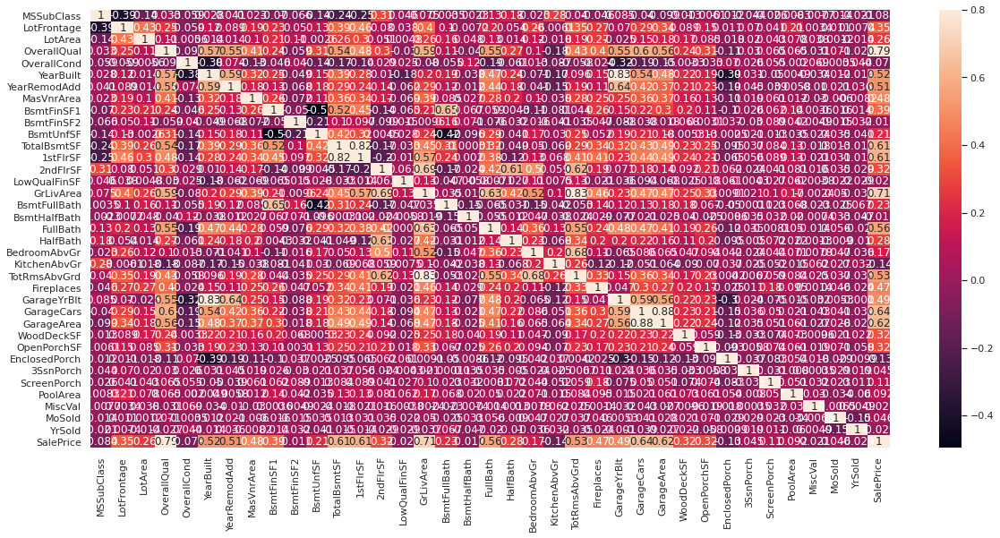

In [7]:
train.drop('Id', axis=1,inplace=True)
corrmat= train.corr()
f, ax = plt.subplots(figsize=(20,9))
sns.heatmap(corrmat, vmax=0.8, annot=True)

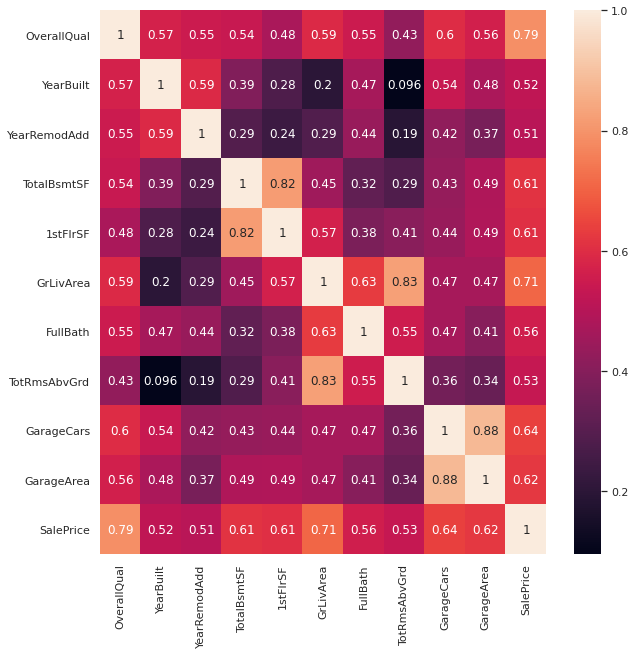

In [8]:
corrmat = train.corr()
top_corr_features = corrmat.loc[abs(corrmat['SalePrice']) > 0.5].index
plt.figure(figsize=(10,10))
g=sns.heatmap(train[top_corr_features].corr(), annot=True)

In [9]:
print("Max Correlation Value with SalePrice is {}, and That is {}".format(    abs(corrmat['SalePrice']).sort_values(ascending=False).values[1], abs(corrmat['SalePrice']).sort_values(ascending=False).index[1]), "!!!")

Max Correlation Value with SalePrice is 0.7909816005838047, and That is OverallQual !!!


<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

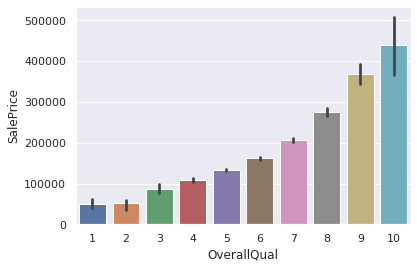

In [10]:
sns.barplot(x=train['OverallQual'], y =train['SalePrice'])

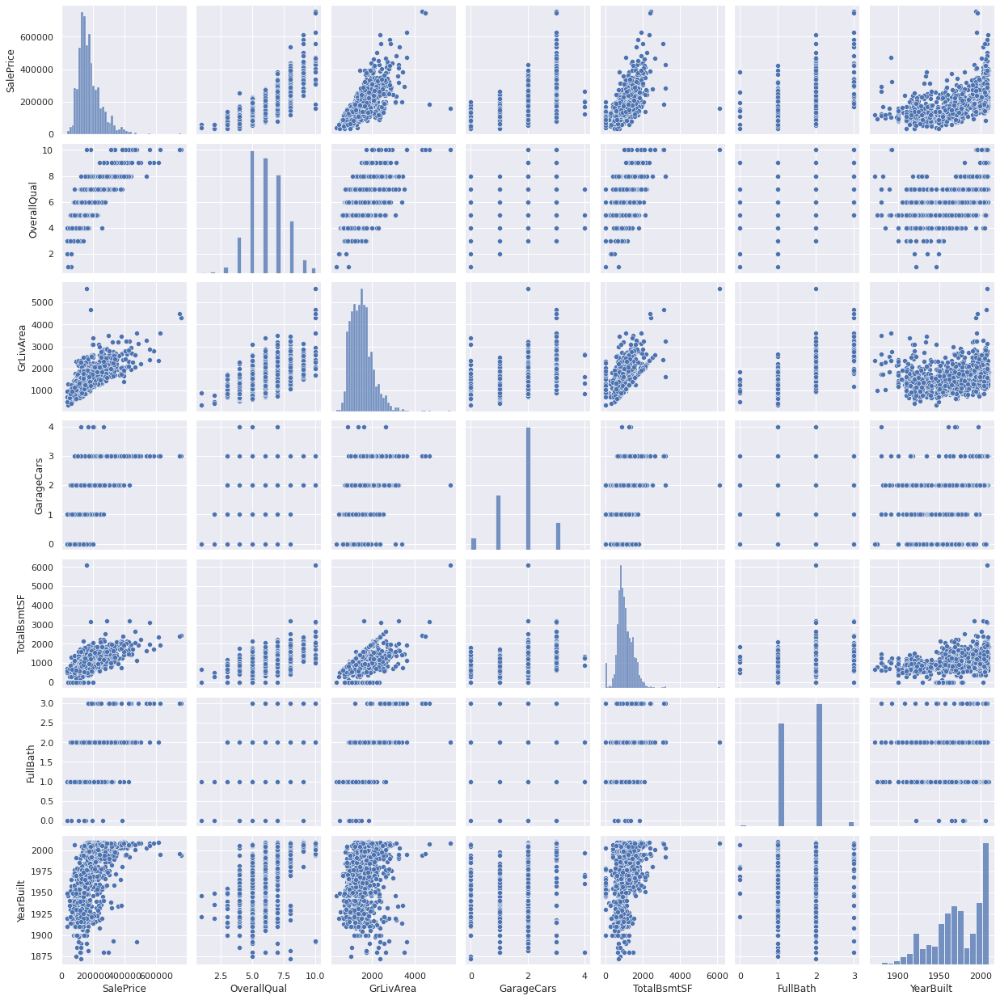

In [11]:
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(train[cols], size = 2.5)
plt.show()


In [12]:
all_data.isnull().sum()

MSSubClass         0
MSZoning           4
LotFrontage      486
LotArea            0
Street             0
                ... 
MiscVal            0
MoSold             0
YrSold             0
SaleType           1
SaleCondition      0
Length: 79, dtype: int64

In [13]:
all_data.dtypes.value_counts()

object     43
int64      25
float64    11
dtype: int64

In [14]:
all_data.shape

(2919, 79)

## 2) Feature Engineering


### 2-1) categorical + numerical features 분리하기
- using `select_dtypes()`.    
- numerical 데이터 중 month나 year 등의 데이터는 categorical로 분류해주기 `apply(str)`  
      

In [15]:
all_data.select_dtypes(exclude=object).columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')

In [16]:
num_to_cat = [ 'MoSold', 'YrSold']

for col in num_to_cat:
    all_data[col]=all_data[col].apply(str)

In [17]:
categorical_features= all_data.select_dtypes(include=object).columns
categorical_features

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold',
       'YrSold', 'SaleType', 'SaleCondition'],
      dtype='object')

In [18]:
numerical_features= all_data.select_dtypes(exclude=object).columns
numerical_features

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'],
      dtype='object')

### 2-2) 비어있는 missing 데이터 채우기  
- numerical: mean, median, mode 를 활용하여 데이터 채우기 `.fillna(xxx)`, `mean(), median(), mode()`
- categorical: `pd.get_dummies()` 나 `LabelEncoder`를 활용해서 missing 데이터도 없애고, one-hot encoding도 완성하기

아래에선 `LabelEncoder`를 통해, categorical data를 라벨링 하였다.

In [19]:
all_data[numerical_features] = all_data[numerical_features].fillna(all_data[numerical_features].median())

In [20]:
print("Remain NA value in numerical features: {}".format(all_data[numerical_features].isnull().values.sum()))

Remain NA value in numerical features: 0


In [21]:
print("Befor LabelEncoder")
all_data['PoolQC']

Befor LabelEncoder


0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
2914    NaN
2915    NaN
2916    NaN
2917    NaN
2918    NaN
Name: PoolQC, Length: 2919, dtype: object

In [22]:
from sklearn.preprocessing import LabelEncoder

for col in categorical_features:
    lbl = LabelEncoder()
    lbl.fit(list(all_data[col].values))
    all_data[col] = lbl.transform(list(all_data[col].values))

#all_data[categorical_features] = pd.get_dummies(all_data[categorical_features]) 의 방식을 통해서 one-hot encoding 해버리고, cat->num 으로 만들 수 있음

In [23]:
print("After LabelEncoder")
all_data['PoolQC']

After LabelEncoder


0       3
1       3
2       3
3       3
4       3
       ..
2914    3
2915    3
2916    3
2917    3
2918    3
Name: PoolQC, Length: 2919, dtype: int64

In [24]:
all_data.dtypes.value_counts()

int64      68
float64    11
dtype: int64

In [25]:
print("ALL DATA FILL completely: {}".format(all_data.isnull().values.sum()))

ALL DATA FILL completely: 0


### 2-3) data의 skewness 줄이기 
- y_label 데이터도 skewness 가 있으면 줄인다음에 학습하는 것이 학습결과에 이득
- numerical data 의 skewness 줄이기  

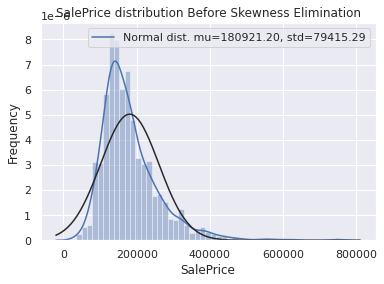

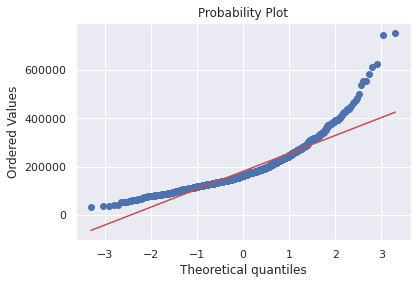

In [26]:
from scipy import stats
from scipy.stats import norm, skew # for some statistics

sns.distplot(y_label, fit=norm)

(mu,sigma) = norm.fit(y_label)
plt.legend(['Normal dist. mu={:.2f}, std={:.2f}'.format(mu,sigma)], loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution Before Skewness Elimination')

fig = plt.figure()
res = stats.probplot(y_label, plot=plt)
plt.show()


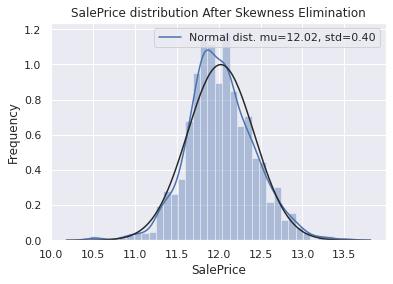

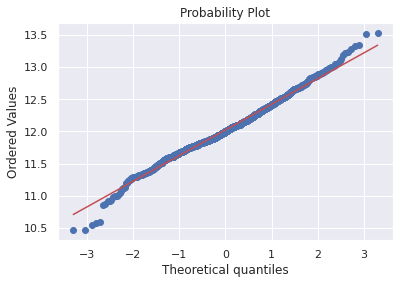

In [27]:
import numpy as np
y_label = np.log1p(y_label)

sns.distplot(y_label, fit=norm)

(mu,sigma) = norm.fit(y_label)
plt.legend(['Normal dist. mu={:.2f}, std={:.2f}'.format(mu,sigma)], loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution After Skewness Elimination')

fig = plt.figure()
res = stats.probplot(y_label, plot=plt)
plt.show()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,4.110874,3,4.189655,9.042040,1,2,3,3,0,4,...,0.0,0.0,3,4,4,0.0,4,2,8,4
1,3.044522,3,4.394449,9.169623,1,2,3,3,0,2,...,0.0,0.0,3,4,4,0.0,7,1,8,4
2,4.110874,3,4.234107,9.328212,1,2,0,3,0,4,...,0.0,0.0,3,4,4,0.0,11,2,8,4


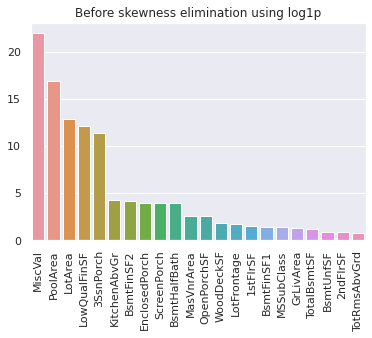

In [28]:
# 여기선, categorical을 LabelEncoder() 을 하여서 숫자가 되어버렸기 때문에 numerical_features만 care
skewness = all_data[numerical_features].apply(lambda x: skew(x.dropna()))
skewness = skewness.sort_values(ascending=False)
skewness = skewness[abs(skewness)>0.75]

plt.xticks(rotation='90')
sns.barplot(x=skewness.index, y=skewness.values)
plt.title('Before skewness elimination using log1p')


for col in skewness.index:
    all_data[col] = np.log1p(all_data[col])

all_data.head(3)

Text(0.5, 1.0, 'After skewness elimination using log1p')

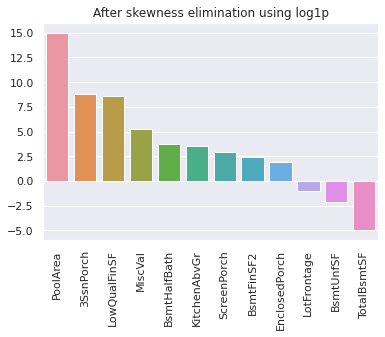

In [29]:
skewness = all_data[numerical_features].apply(lambda x: skew(x.dropna()))
skewness = skewness.sort_values(ascending=False)
skewness = skewness[abs(skewness)>0.75]

plt.xticks(rotation='90')
sns.barplot(x=skewness.index, y=skewness.values)
plt.title('After skewness elimination using log1p')

![image](https://www.safaribooksonline.com/library/view/clojure-for-data/9781784397180/graphics/7180OS_01_180.jpg)  
- for more info click [Here](https://www.google.co.in/url?sa=t&rct=j&q=&esrc=s&source=web&cd=3&cad=rja&uact=8&ved=0ahUKEwi7i-jN-K7XAhWJKo8KHbIHAV4QFgguMAI&url=http%3A%2F%2Fwhatis.techtarget.com%2Fdefinition%2Fskewness&usg=AOvVaw1LJhHdq4KFEYIpfdXjOlF-)  

### 2-4) new feature / del feature
- 필요하다면 하는 것이고, 여기선 하지 않겠다.

## 3) Modeling
- CrossValidation using `cross_val_score, KFold. train_test_split`.          
- Regressor : `LinearRegression, RidgeCV, LassoCV, ElasticNetCV` 
- Classifier  : `KNN, RandomForest, ...`
- Techniques: `StandardScaler, RobustScaler`.
- Easy modeling: `make_pipeline`

In [30]:
from sklearn.model_selection import cross_val_score, train_test_split, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.pipeline import make_pipeline

In [31]:
# Split the data to train the model
X_train, X_valid, y_train, y_valid = train_test_split(all_data[:n_train], y_label, test_size=0.3, random_state=0)
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((1022, 79), (438, 79), (1022,), (438,))

In [32]:
# Defining cross_val_score function for both train and test sets seperately
n_folds = 5
def rmse_CV_train(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(all_data[:n_train].values)
    rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf))
    return rmse

def rmse_CV_valid(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(all_data[:n_train].values)
    rmse = np.sqrt(-cross_val_score(model, X_valid, y_valid, scoring='neg_mean_squared_error', cv=kf))
    return rmse

In [33]:
lr = make_pipeline(RobustScaler(), LinearRegression())
lr.fit(X_train, y_train)
train_predict = lr.predict(X_train)
valid_predict = lr.predict(X_valid)

print("rmse on train", rmse_CV_train(lr).mean())
print("rmse on valid", rmse_CV_valid(lr).mean())


rmse on train 25546377009.010994
rmse on valid 21526784181.920757


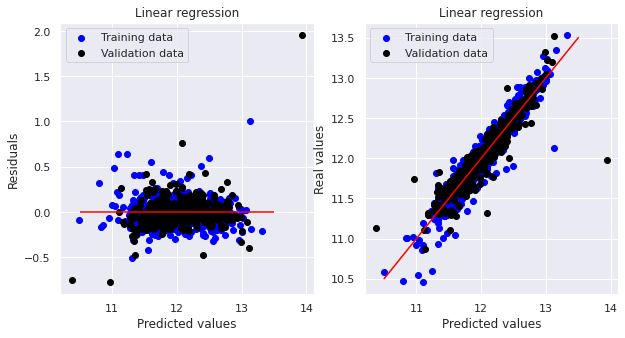

In [34]:
#plot between predicted values and residuals
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.scatter(train_predict, train_predict - y_train, c = "blue",  label = "Training data")
plt.scatter(valid_predict,valid_predict - y_valid, c = "black",  label = "Validation data")
plt.title("Linear regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "upper left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")

# Plot predictions - Real values
plt.subplot(1,2,2)
plt.scatter(train_predict, y_train, c = "blue",  label = "Training data")
plt.scatter(valid_predict, y_valid, c = "black",  label = "Validation data")
plt.title("Linear regression")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

In [35]:
test_predict_lr = lr.predict(all_data[n_train:])

In [36]:
lr = make_pipeline(RobustScaler(), LinearRegression())
lr.fit(X_train, y_train)
train_predict = lr.predict(X_train)
valid_predict = lr.predict(X_valid)

print("rmse on train", rmse_CV_train(lr).mean())
print("rmse on valid", rmse_CV_valid(lr).mean())


rmse on train 25546377009.010994
rmse on valid 21526784181.920757


In [37]:
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=[0.1, 0.3, 0.6, 3, 6, 10, 30, 60]))
ridge.fit(X_train, y_train)
alpha= ridge[1].alpha_
print('best alpha: {}'.format(alpha))

print('Ridge RMSE on Traing set: ', rmse_CV_train(ridge).mean())
print('Ridge RMSE on Valid set: ', rmse_CV_valid(ridge).mean())

y_train_rdg = ridge.predict(X_train)
y_valid_rdg = ridge.predict(X_valid)

best alpha: 30.0
Ridge RMSE on Traing set:  0.1343399004864074
Ridge RMSE on Valid set:  0.15202961055948744


In [38]:
coef = pd.Series(ridge[1].coef_, index = X_train.columns)
print("Ridge picked " + str(sum(coef!=0)) + " variables and eliminated the other " + str(sum(coef==0)) + " variables")

Ridge picked 79 variables and eliminated the other 0 variables


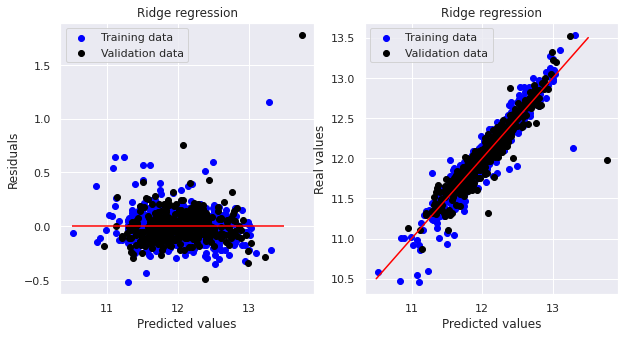

In [39]:
#plot between predicted values and residuals
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.scatter(y_train_rdg, y_train_rdg - y_train, c = "blue",  label = "Training data")
plt.scatter(y_valid_rdg,y_valid_rdg - y_valid, c = "black",  label = "Validation data")
plt.title("Ridge regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "upper left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")

# Plot predictions - Real values
plt.subplot(1,2,2)
plt.scatter(y_train_rdg, y_train, c = "blue",  label = "Training data")
plt.scatter(y_valid_rdg, y_valid, c = "black",  label = "Validation data")
plt.title("Ridge regression")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

In [40]:
test_predict_rdg = ridge.predict(all_data[n_train:])

In [41]:
lasso = make_pipeline(RobustScaler(), LassoCV(alphas=[0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6]))
lasso.fit(X_train, y_train)
alpha= lasso[1].alpha_
print('best alpha: {}'.format(alpha))

print('Ridge RMSE on Traing set: ', rmse_CV_train(lasso).mean())
print('Ridge RMSE on Valid set: ', rmse_CV_valid(lasso).mean())

y_train_lss = lasso.predict(X_train)
y_valid_lss = lasso.predict(X_valid)

best alpha: 0.003
Ridge RMSE on Traing set:  0.1314005291677251
Ridge RMSE on Valid set:  0.15294591540498653


In [42]:
coef = pd.Series(lasso[1].coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coef!=0)) + " variables and eliminated the other " + str(sum(coef==0)) + " variables")

Lasso picked 42 variables and eliminated the other 37 variables


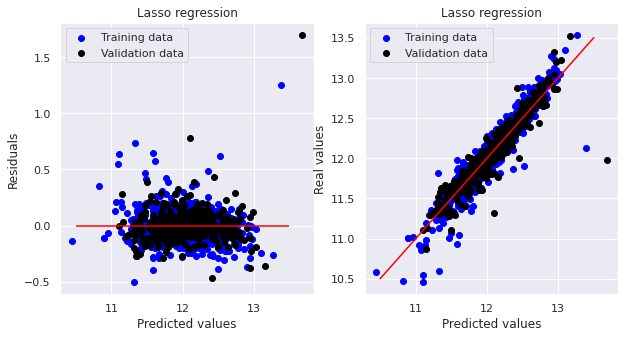

In [43]:
#plot between predicted values and residuals
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.scatter(y_train_lss, y_train_lss - y_train, c = "blue",  label = "Training data")
plt.scatter(y_valid_lss,y_valid_lss - y_valid, c = "black",  label = "Validation data")
plt.title("Lasso regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "upper left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")

# Plot predictions - Real values
plt.subplot(1,2,2)
plt.scatter(y_train_lss, y_train, c = "blue",  label = "Training data")
plt.scatter(y_valid_lss, y_valid, c = "black",  label = "Validation data")
plt.title("Lasso regression")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

In [44]:
test_predict_lss = lasso.predict(all_data[n_train:])

In [45]:
ENet = make_pipeline(RobustScaler(), ElasticNetCV(l1_ratio=0.9, random_state=3))
ENet.fit(X_train, y_train)

print('ENet RMSE on Traing set: ', rmse_CV_train(ENet).mean())
print('ENet RMSE on Valid set: ', rmse_CV_valid(ENet).mean())

y_train_ENet = ENet.predict(X_train)
y_valid_ENet = ENet.predict(X_valid)

ENet RMSE on Traing set:  0.13157966590299525
ENet RMSE on Valid set:  0.1527743238224663


In [46]:
test_predict_ENet = ENet.predict(all_data[n_train:])

In [47]:
#log(x+1)을 해서 skew를 없앤 y_label데이터를 썼으니, 환산할 때는 inverse인 exp(x)-1을 해야지, 우리가 진짜 원하는 house price가 나오지
house_price_predict = np.expm1(test_predict_lr) #제출결과: 0.13823
house_price_predict = np.expm1(test_predict_rdg) #제출결과: 0.13346
house_price_predict = np.expm1(test_predict_lss) #제출결과: 0.13134 
house_price_predict = np.expm1(test_predict_ENet) #제출결과: 0.13114 (제일 나아지긴 했네)


In [48]:
sub = pd.DataFrame()
sub['Id']=all_data_Id[n_train:]
sub['SalePrice']=house_price_predict

sub.to_csv('submission2.csv', index=False)
sub.head()

,Id,SalePrice
1460,1461,124289.891708
1461,1462,158532.730330
1462,1463,179225.174642
1463,1464,199048.974365
1464,1465,187118.373224


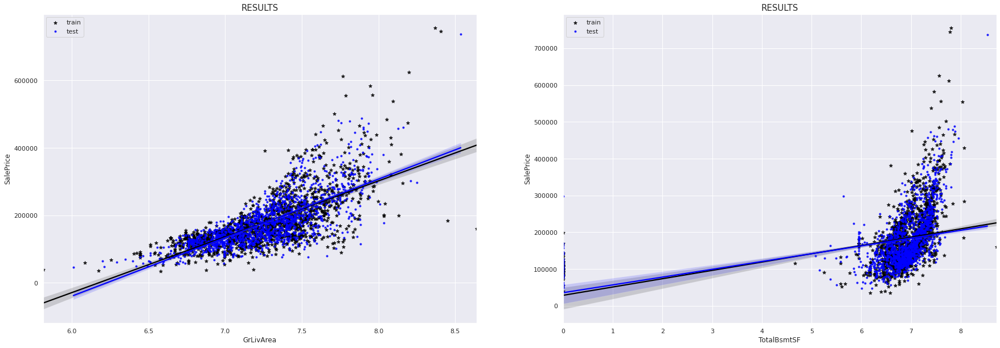

In [49]:
test_aug = pd.concat([all_data[n_train:], sub], axis=1).reset_index()
train_aug = pd.concat([all_data[:n_train], np.expm1(y_label)], axis=1).reset_index()

fig = plt.figure(figsize=(30,10))
plt.subplot(1,2,1)
plt.title('RESULTS', fontsize=15)
sns.regplot(data=train_aug, x='GrLivArea', y='SalePrice', color ='black', marker='*', label='train')
sns.regplot(data=test_aug, x='GrLivArea', y='SalePrice', color='blue', marker='.', label='test')
plt.legend()

plt.subplot(1,2,2)
plt.title('RESULTS', fontsize=15)
sns.regplot(data=train_aug, x='TotalBsmtSF', y='SalePrice', color ='black', marker='*', label='train')
sns.regplot(data=test_aug, x='TotalBsmtSF', y='SalePrice', color='blue', marker='.', label='test')
plt.legend()

test 데이터셋을 가지고 예측한 결과를 보았을때 나오는 `SalePrice`의 회귀선이, train 데이터와 얼마나 유사한 회귀선을 가지고 있는지 그려본 것,
train 데이터에서 학습한 회귀선이 test에 적용된 것을 볼 수 있다. 

# End